In [2]:
%matplotlib inline

import gym
import matplotlib
import numpy as np
import sys

from collections import defaultdict

if "../" not in sys.path:
  sys.path.append("../") 
from lib.envs.blackjack import BlackjackEnv
from lib import plotting

matplotlib.style.use('ggplot')

/home/mpheng/workspace/reinforcement_learning/reinforcement_learning_playground/reinforcement-learning/env/lib/python3.10/site-packages/gym/__init__.py


In [3]:
env = BlackjackEnv()

In [4]:
def mc_prediction(policy, env, num_episodes, discount_factor=1.0):
    """
    Monte Carlo prediction algorithm. Calculates the value function
    for a given policy using sampling.
    
    Args:
        policy: A function that maps an observation to action probabilities.
        env: OpenAI gym environment.
        num_episodes: Number of episodes to sample.
        discount_factor: Gamma discount factor.
    
    Returns:
        A dictionary that maps from state -> value.
        The state is a tuple and the value is a float.
    """

    # Keeps track of sum and count of returns for each state
    # to calculate an average. We could use an array to save all
    # returns (like in the book) but that's memory inefficient.
    returns_sum = defaultdict(float)
    returns_count = defaultdict(float)
    
    # The final value function
    V = defaultdict(float)
    
    # Implement this!
    for i_episode in range(num_episodes):
        state = env.reset()
        episode = []
        print(f"{i_episode = }")
        for t in range(100):
            action = policy(state)
            next_state, reward, done, _ = env.step(action)
            episode.append((state, action, reward))
            if done:
                break
            state = next_state

        # make sure all the unique states are captured with set()        
        states_in_episode = set()
        for e in episode:
            curr_state = e[0]
            states_in_episode.add(curr_state)

        # iterate through all unique states
        for state in states_in_episode:
            first_occurance_idx = None
            # find the first occurance of the unique state
            for idx, e in enumerate(episode):
                if e[0] == state:
                    first_occurance_idx = idx
                    break
            # Sum up all the rewards until the first state occurs
            G = 0
            # from starting state till terminal state
            for i, ep in enumerate(episode[first_occurance_idx:]):
                reward = ep[2]
                G += reward * (discount_factor**i)
                returns_sum[state] += G
                returns_count[state] += 1.0
            
        for state in states_in_episode:
            V[state] = returns_sum[state] / returns_count[state]
    

    return V    

In [5]:
def sample_policy(observation):
    """
    A policy that sticks if the player score is > 20 and hits otherwise.
    """
    score, dealer_score, usable_ace = observation
    return 0 if score >= 20 else 1

i_episode = 0
i_episode = 1
i_episode = 2
i_episode = 3
i_episode = 4
i_episode = 5
i_episode = 6
i_episode = 7
i_episode = 8
i_episode = 9
i_episode = 10
i_episode = 11
i_episode = 12
i_episode = 13
i_episode = 14
i_episode = 15
i_episode = 16
i_episode = 17
i_episode = 18
i_episode = 19
i_episode = 20
i_episode = 21
i_episode = 22
i_episode = 23
i_episode = 24
i_episode = 25
i_episode = 26
i_episode = 27
i_episode = 28
i_episode = 29
i_episode = 30
i_episode = 31
i_episode = 32
i_episode = 33
i_episode = 34
i_episode = 35
i_episode = 36
i_episode = 37
i_episode = 38
i_episode = 39
i_episode = 40
i_episode = 41
i_episode = 42
i_episode = 43
i_episode = 44
i_episode = 45
i_episode = 46
i_episode = 47
i_episode = 48
i_episode = 49
i_episode = 50
i_episode = 51
i_episode = 52
i_episode = 53
i_episode = 54
i_episode = 55
i_episode = 56
i_episode = 57
i_episode = 58
i_episode = 59
i_episode = 60
i_episode = 61
i_episode = 62
i_episode = 63
i_episode = 64
i_episode = 65
i_episode = 66
i_epi

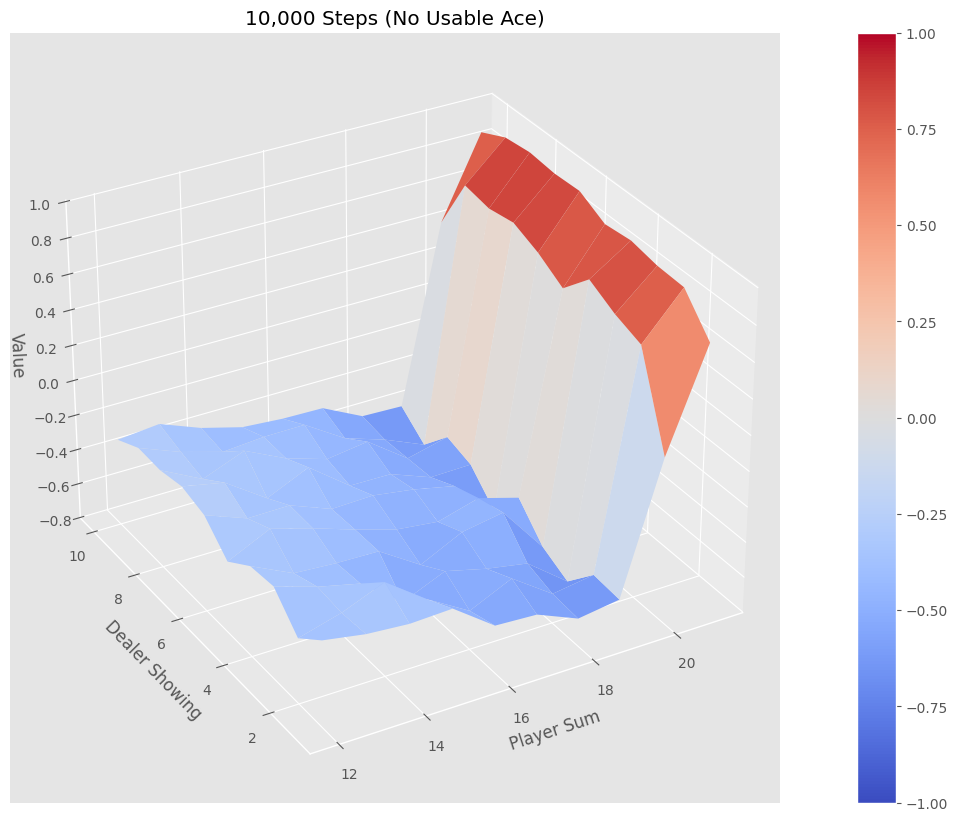

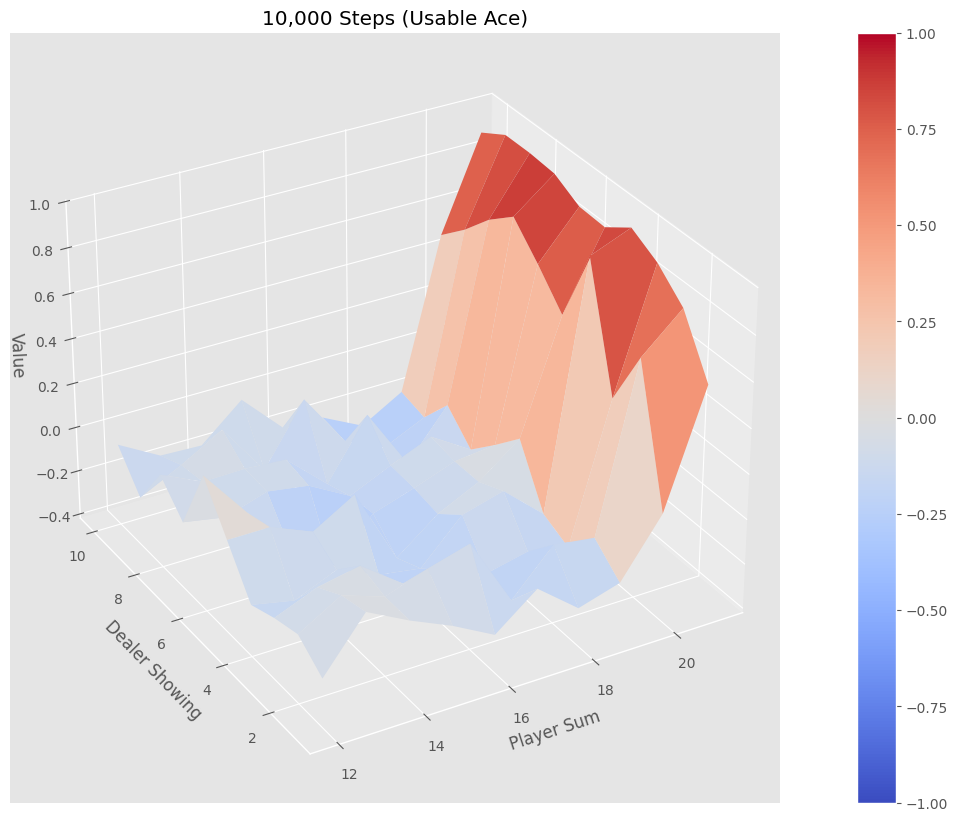

i_episode = 0
i_episode = 1
i_episode = 2
i_episode = 3
i_episode = 4
i_episode = 5
i_episode = 6
i_episode = 7
i_episode = 8
i_episode = 9
i_episode = 10
i_episode = 11
i_episode = 12
i_episode = 13
i_episode = 14
i_episode = 15
i_episode = 16
i_episode = 17
i_episode = 18
i_episode = 19
i_episode = 20
i_episode = 21
i_episode = 22
i_episode = 23
i_episode = 24
i_episode = 25
i_episode = 26
i_episode = 27
i_episode = 28
i_episode = 29
i_episode = 30
i_episode = 31
i_episode = 32
i_episode = 33
i_episode = 34
i_episode = 35
i_episode = 36
i_episode = 37
i_episode = 38
i_episode = 39
i_episode = 40
i_episode = 41
i_episode = 42
i_episode = 43
i_episode = 44
i_episode = 45
i_episode = 46
i_episode = 47
i_episode = 48
i_episode = 49
i_episode = 50
i_episode = 51
i_episode = 52
i_episode = 53
i_episode = 54
i_episode = 55
i_episode = 56
i_episode = 57
i_episode = 58
i_episode = 59
i_episode = 60
i_episode = 61
i_episode = 62
i_episode = 63
i_episode = 64
i_episode = 65
i_episode = 66
i_epi

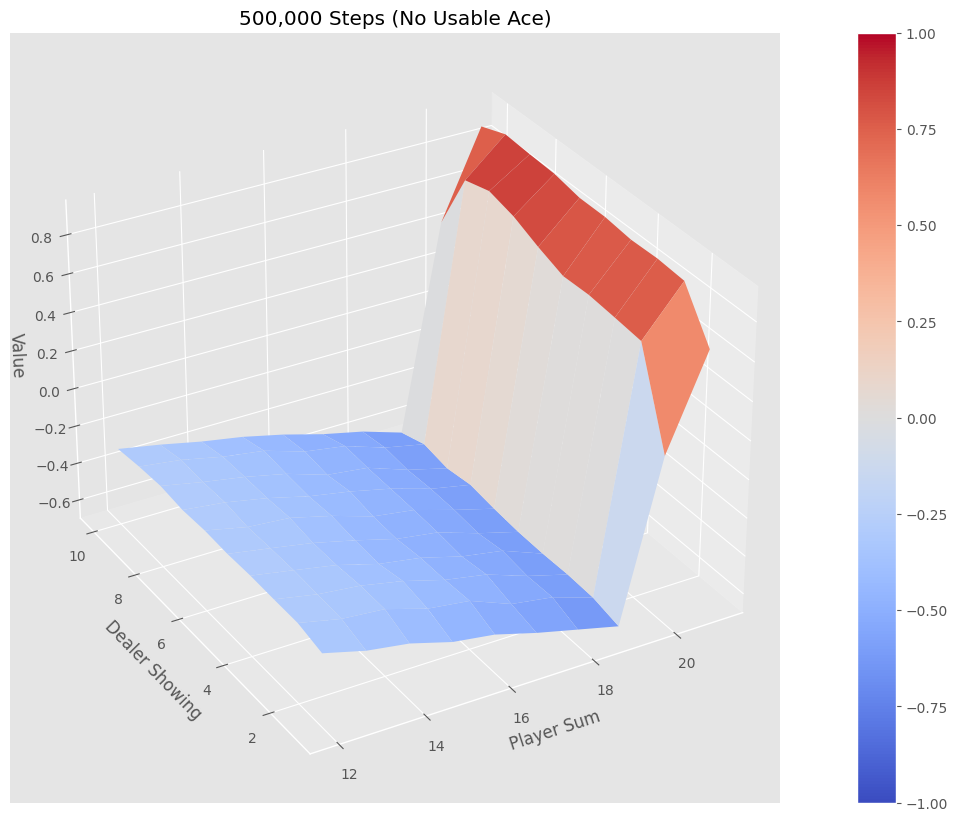

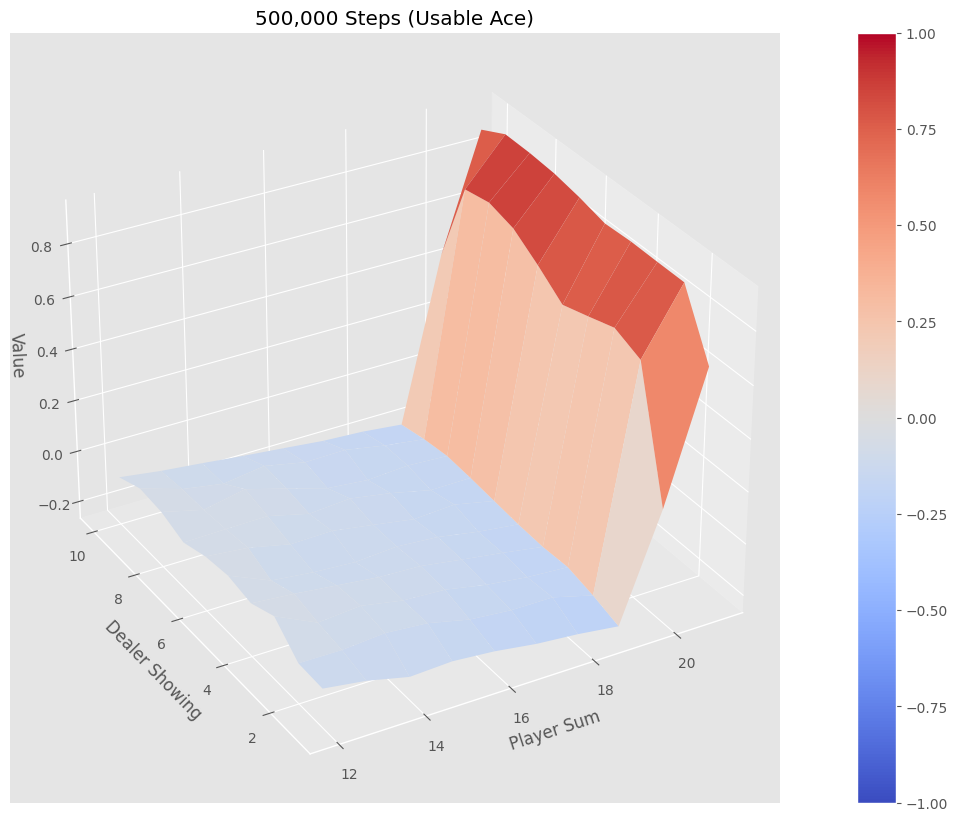

In [6]:
V_10k = mc_prediction(sample_policy, env, num_episodes=10000)
plotting.plot_value_function(V_10k, title="10,000 Steps")

V_500k = mc_prediction(sample_policy, env, num_episodes=500000)
plotting.plot_value_function(V_500k, title="500,000 Steps")